PART 1: Exploratory data analysis

In [199]:
import pandas as pd 
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objects as go


init_notebook_mode(connected=True)         # initiate notebook for offline plot

logins=pd.read_json(r'C:\Users\vu.nguyen.SILIXA\Desktop\Literature Review\Courses\Data Science SpringBoard\Unit 17_ Take home Challenger\ultimate_challenge\logins.json')



In [175]:
logins.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93142 entries, 0 to 93141
Data columns (total 1 columns):
login_time    93142 non-null datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 727.8 KB


In [200]:

logins.reset_index(inplace=True)
logins.set_index('login_time',inplace=True)

logins['index']=1
logins_backup=logins.copy()


logins=logins.resample('15min').count()



In [177]:
logins.head()
logins.index


DatetimeIndex(['1970-01-01 20:00:00', '1970-01-01 20:15:00',
               '1970-01-01 20:30:00', '1970-01-01 20:45:00',
               '1970-01-01 21:00:00', '1970-01-01 21:15:00',
               '1970-01-01 21:30:00', '1970-01-01 21:45:00',
               '1970-01-01 22:00:00', '1970-01-01 22:15:00',
               ...
               '1970-04-13 16:30:00', '1970-04-13 16:45:00',
               '1970-04-13 17:00:00', '1970-04-13 17:15:00',
               '1970-04-13 17:30:00', '1970-04-13 17:45:00',
               '1970-04-13 18:00:00', '1970-04-13 18:15:00',
               '1970-04-13 18:30:00', '1970-04-13 18:45:00'],
              dtype='datetime64[ns]', name='login_time', length=9788, freq='15T')

In [201]:
data = [go.Scatter(x=logins.index,
            y=logins['index'])]



layout = go.Layout(title="User Login Count In 15 Minutes Interval",
                xaxis=dict(title='Time'),
                yaxis=dict(title='Number of Log In'))

fig=go.Figure(data=data, layout=layout)

iplot(fig)

In [ ]:
From the interactive plot above, it reveals that the number of login peaked at around 4:00 to 5:00 AM everyday 

In [202]:
logins_monthly=logins_backup.resample('M').count()
logins_weekly=logins_backup.resample('W').count()

In [203]:
data = [go.Scatter(x=logins_weekly.index,
            y=logins_weekly['index'])]



layout = go.Layout(title="User Login Count Weekly",
                xaxis=dict(title='Time'),
                yaxis=dict(title='Number of Log In'))

fig=go.Figure(data=data, layout=layout)

iplot(fig)

The weekly login count shows some noticeable trend. The number of logins increased sharply from early Januaray until Jan,11 then slightly decreased until Jan 25 before it stays constant until Feb-1st. Then number of login increased from Feb to Aprial 5th. Finally, the number of logins decreased abruptly after that.  

In [208]:
logins_backup.head()



,index
login_time,
1970-01-01 20:13:18,1
1970-01-01 20:16:10,1
1970-01-01 20:16:37,1
1970-01-01 20:16:36,1
1970-01-01 20:26:21,1


In [238]:
logins_daily=logins_backup.copy()
logins_daily=logins_daily.resample('D').count()

logins_daily.reset_index(inplace=True)

logins_daily.info()
#logins_daily['DayofWeek']=logins_daily['login_time'].dt.dayofweek
logins_daily['DayofWeek']=logins_daily['login_time'].dt.weekday_name
logins_daily['Month']=logins_daily['login_time'].dt.strftime('%b')

print(logins_daily.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103 entries, 0 to 102
Data columns (total 2 columns):
login_time    103 non-null datetime64[ns]
index         103 non-null int64
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.7 KB
  login_time  index DayofWeek Month
0 1970-01-01    112  Thursday   Jan
1 1970-01-02    681    Friday   Jan
2 1970-01-03    793  Saturday   Jan
3 1970-01-04    788    Sunday   Jan
4 1970-01-05    459    Monday   Jan


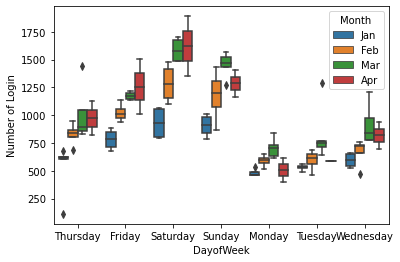

In [240]:
import seaborn as sn 
sn.boxplot(x=logins_daily['DayofWeek'],y=logins_daily['index'],hue=logins_daily['Month'])
plt.ylabel('Number of Login')
plt.show()

The boxplot above shows a lot of information. Generally, the number of user logins increases from Thursday to Saturaday with Saturday has the higher nummber of logins. Then, the number of login decreases as it goes from Saturday to Sunday. Monday to Wednesday generally have lower number of login as compared to Thursday to Sunday. 

Furthermore, from Thursday to Sunday, the number of logins in Jan < number of logins in Feb< number of logins in Mar< number of logins in Apr. In contrast, from Monday to Wed, the number of logins in Jan< < number of logins in Feb< number of logins in Mar. However, the number of login during weekday in Mar now higher than number of login in Apr. 

Part 2 ‑ Experiment and metrics design

The neighboring cities of Gotham and Metropolis have complementary circadian rhythms: on weekdays, Ultimate Gotham is most active at night, and Ultimate Metropolis is most active during the day. On weekends, there is reasonable activity in both cities.

However, a toll bridge, with a two way toll, between the two cities causes driver partners to tend to be exclusive to each city. The Ultimate managers of city operations for the two cities have proposed an experiment to encourage driver partners to be available in both cities, by reimbursing all toll costs.


1. What would you choose as the key measure of success of this experiment in encouraging driver partners to serve both cities, and why would you choose this metric?

To track the success of this experiment, I would track the ratio of  amount of toll reimbursing over the total amount collected An increase in the ratios indicates more drivered were encouraging to be available in both cities.  

2. Describe a practical experiment you would design to compare the effectiveness of the proposed change in relation to the
key measure of success. Please provide details on:
    
a) how you will implement the experiment
To implement this experiment, I will collect the data of how much toll were collected and how much reimbursement were claimed. Then I will analyze the data to find the trend of the ration between reimbursement over total toll collected. 

b) what statistical test(s) you will conduct to verify the significance of the observation
T-test

c) how you would interpret the results and provide recommendations to the city operations team along with any caveats.
I will use visualization to display the trend of the ration between reimbursement over total toll collected. An increase over the time indicates the success of the experiment. In contrast, a decrease over the time indicates the reimbursement program is not effective to encourage drivers to be availabe in both cities. 

Part 3 ‑ Predictive modeling

Ultimate is interested in predicting rider retention. To help explore this question, we have provided a sample dataset of a cohort of users who signed up for an Ultimate account in January 2014. The data was pulled several months later; we consider a user retained if they were “active” (i.e. took a trip) in the preceding 30 days.We would like you to use this data set to help understand what factors are the best predictors for retention, and offer suggestions to operationalize those insights to help Ultimate.

The data is in the attached file ultimate_data_challenge.json. See below for a detailed description of the dataset. Please include any code you wrote for the analysis and delete the dataset when you have finished with the challenge.

1. Perform any cleaning, exploratory analysis, and/or visualizations to use the provided data for this analysis (a few sentences/plots describing your approach will suffice). What fraction of the observed users were retained?

In [245]:
import json

file = open('ultimate_data_challenge.json', 'r')
data = pd.DataFrame(json.load(file))
file.close()

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
avg_dist                  50000 non-null float64
avg_rating_by_driver      49799 non-null float64
avg_rating_of_driver      41878 non-null float64
avg_surge                 50000 non-null float64
city                      50000 non-null object
last_trip_date            50000 non-null object
phone                     49604 non-null object
signup_date               50000 non-null object
surge_pct                 50000 non-null float64
trips_in_first_30_days    50000 non-null int64
ultimate_black_user       50000 non-null bool
weekday_pct               50000 non-null float64
dtypes: bool(1), float64(6), int64(1), object(4)
memory usage: 4.2+ MB


In [261]:
# change last_trip_date to datetime
data['last_trip_date']=pd.to_datetime(df['last_trip_date'])
data['signup_date']=pd.to_datetime(df['signup_date'])

In [262]:
data.head()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct
24275,2.17,4.7,4.8,1.00,King's Landing,2014-07-01,iPhone,2014-01-08,0.0,7,True,67.6
23681,3.14,4.4,3.1,1.02,Astapor,2014-07-01,iPhone,2014-01-21,7.1,5,True,75.0
4385,2.58,4.7,4.6,1.08,King's Landing,2014-07-01,iPhone,2014-01-06,13.9,0,True,77.8
45155,5.24,4.6,4.8,1.03,Winterfell,2014-07-01,iPhone,2014-01-28,5.7,3,False,66.0
38661,4.07,4.7,4.4,1.16,Winterfell,2014-07-01,iPhone,2014-01-18,28.1,4,False,65.6


In [251]:
col_name=data.columns

fig=go.Figure()

for i,col in enumerate(col_name):
    fig.add_trace(go.Box(y=data.iloc[:,i], name=col_name[i]))
    

iplot(fig)

In [254]:
data=data.dropna()
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41445 entries, 0 to 49998
Data columns (total 12 columns):
avg_dist                  41445 non-null float64
avg_rating_by_driver      41445 non-null float64
avg_rating_of_driver      41445 non-null float64
avg_surge                 41445 non-null float64
city                      41445 non-null object
last_trip_date            41445 non-null object
phone                     41445 non-null object
signup_date               41445 non-null object
surge_pct                 41445 non-null float64
trips_in_first_30_days    41445 non-null int64
ultimate_black_user       41445 non-null bool
weekday_pct               41445 non-null float64
dtypes: bool(1), float64(6), int64(1), object(4)
memory usage: 3.8+ MB


In [263]:
data.sort_values(by=['last_trip_date'], ascending=False, inplace=True)
data.head()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct
24275,2.17,4.7,4.8,1.00,King's Landing,2014-07-01,iPhone,2014-01-08,0.0,7,True,67.6
29101,7.19,5.0,5.0,1.05,King's Landing,2014-07-01,iPhone,2014-01-13,20.0,0,False,60.0
39529,16.07,5.0,5.0,1.00,King's Landing,2014-07-01,iPhone,2014-01-25,0.0,2,False,80.0
12883,2.87,4.9,5.0,1.00,Winterfell,2014-07-01,Android,2014-01-06,0.0,3,True,76.5
21142,3.34,4.9,5.0,1.04,King's Landing,2014-07-01,iPhone,2014-01-18,7.3,5,False,60.0


Because the most recent last trip date is 2014-07-01, it's assume this will be the day the study was conducted, so we will take 30 days prior to be the retained period 



In [269]:
from datetime import timedelta
retain_date=max(data.last_trip_date)-timedelta(days=30)
print(retain_date)

active_user=data[data['last_trip_date']>=retain_date]
num_active=active_user['avg_dist'].count()

2014-06-01 00:00:00


In [275]:
print('The fraction of retained user is:',(num_active/data['avg_dist'].count()) )

The fraction of retained user is: 0.41102666184099407


2. Build a predictive model to help Ultimate determine whether or not a user will be active in their 6th month on the system. Discuss why you chose your approach, what alternatives you considered, and any concerns you have. How valid is your model?
Include any key indicators of model performance.

In [277]:
# To assigned 0 or 1 for inactive and retained user respectively to the new column 'Retain?'

data['Retain?']=0  
data.loc[   (data['last_trip_date']>=retain_date) , 'Retain?']=1 
data.head()

,avg_dist,avg_rating_by_driver,avg_rating_of_driver,avg_surge,city,last_trip_date,phone,signup_date,surge_pct,trips_in_first_30_days,ultimate_black_user,weekday_pct,Retain?
24275,2.17,4.7,4.8,1.00,King's Landing,2014-07-01,iPhone,2014-01-08,0.0,7,True,67.6,1
29101,7.19,5.0,5.0,1.05,King's Landing,2014-07-01,iPhone,2014-01-13,20.0,0,False,60.0,1
39529,16.07,5.0,5.0,1.00,King's Landing,2014-07-01,iPhone,2014-01-25,0.0,2,False,80.0,1
12883,2.87,4.9,5.0,1.00,Winterfell,2014-07-01,Android,2014-01-06,0.0,3,True,76.5,1
21142,3.34,4.9,5.0,1.04,King's Landing,2014-07-01,iPhone,2014-01-18,7.3,5,False,60.0,1


(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 <a list of 9 Text major ticklabel objects>)

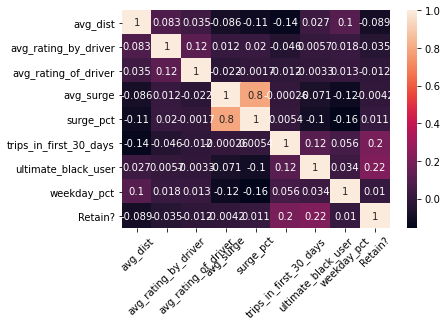

In [279]:
import seaborn as sns
data_corr=data.corr(method='pearson')
plt.figure()
sns.heatmap(data_corr, annot=True)
plt.xticks(rotation=45)

In [284]:
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 41445 entries, 24275 to 49772
Data columns (total 13 columns):
avg_dist                  41445 non-null float64
avg_rating_by_driver      41445 non-null float64
avg_rating_of_driver      41445 non-null float64
avg_surge                 41445 non-null float64
city                      41445 non-null object
last_trip_date            41445 non-null datetime64[ns]
phone                     41445 non-null object
signup_date               41445 non-null datetime64[ns]
surge_pct                 41445 non-null float64
trips_in_first_30_days    41445 non-null int64
ultimate_black_user       41445 non-null bool
weekday_pct               41445 non-null float64
Retain?                   41445 non-null int64
dtypes: bool(1), datetime64[ns](2), float64(6), int64(2), object(2)
memory usage: 4.2+ MB


In [306]:
from collections import Counter
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix



# creating instance of labelencoder. Hot Encoding object and Boolean column 
labelencoder = LabelEncoder()
data['City_Code'] = labelencoder.fit_transform(data['city'])
data['ultimate_black_user_code'] = labelencoder.fit_transform(data['ultimate_black_user'])


target=data['Retain?']
features=data.drop(['Retain?','last_trip_date','signup_date','phone','city','ultimate_black_user'],axis=1)

print(features.head())


counter=Counter(target)
for k,v in counter.items():
	per = v / len(target) * 100
	print('Class=%d, Count=%d, Percentage= %.2f%%' % (k, v, per))

       avg_dist  avg_rating_by_driver  avg_rating_of_driver  avg_surge  \
24275      2.17                   4.7                   4.8       1.00   
29101      7.19                   5.0                   5.0       1.05   
39529     16.07                   5.0                   5.0       1.00   
12883      2.87                   4.9                   5.0       1.00   
21142      3.34                   4.9                   5.0       1.04   

       surge_pct  trips_in_first_30_days  weekday_pct  City_Code  \
24275        0.0                       7         67.6          1   
29101       20.0                       0         60.0          1   
39529        0.0                       2         80.0          1   
12883        0.0                       3         76.5          2   
21142        7.3                       5         60.0          1   

       ultimate_black_user_code  
24275                         1  
29101                         0  
39529                         0  
12883     

As illustrated above, the class distribution between "Retained" and "Not Retained" users are fairly balanced. 

In [307]:
# to split dataset into training and test dataset. Note that the distribution of class labels 
# are the same by using 'stratify' option

scale=StandardScaler()
scale.fit(features)
features_scale=scale.transform(features)


features_scale=pd.DataFrame(features_scale)


features_scale.columns=features.columns

x_train,x_test,y_train,y_test=train_test_split(features_scale,target,test_size=0.3, random_state=8,stratify=target)

In [308]:
# Base Case Performance 
def evaluate_model_baseline(x, y, model):
    no_split=10
    no_repeat=3
    rkf = RepeatedStratifiedKFold(n_splits=no_split, n_repeats=no_repeat, random_state=123)
    score=list()

    for train_idx, val_idx in rkf.split(x,y): 
        x_train,x_val=x.iloc[train_idx],x.iloc[val_idx]
        y_train,y_val=y.iloc[train_idx],y.iloc[val_idx]
        
        
        # model=LogisticRegression(solver='newton-cg',multi_class='multinomial',max_iter=200)
        model.fit(x_train,y_train)
        
        val_preds=model.predict(x_val)
        score.append(f1_score(y_val, val_preds, average='macro'))
        
        
        ave_f1score=np.mean(score)
        
        
    return model,score 


rf = RandomForestClassifier()

m,scores=evaluate_model_baseline(x_train, y_train, rf)

train_score=np.average(scores)

test_pred_baseline=m.predict(x_test)
test_score_bs=(f1_score(test_pred_baseline,y_test,average='macro'))

print(classification_report(test_pred_baseline,y_test))

              precision    recall  f1-score   support

           0       0.77      0.77      0.77      7319
           1       0.67      0.67      0.67      5115

    accuracy                           0.73     12434
   macro avg       0.72      0.72      0.72     12434
weighted avg       0.73      0.73      0.73     12434



Feature: 0, Score: 0.29353
Feature: 1, Score: 0.12431
Feature: 2, Score: 0.08215
Feature: 3, Score: 0.07047
Feature: 4, Score: 0.09184
Feature: 5, Score: 0.08422
Feature: 6, Score: 0.14530
Feature: 7, Score: 0.07289
Feature: 8, Score: 0.03529


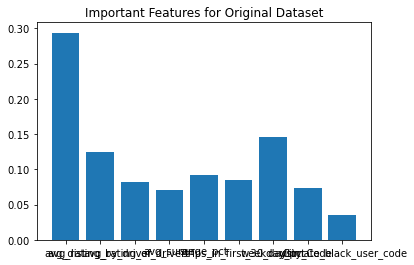

In [318]:
# Compute Important Features Using Random Forest 
importance=m.feature_importances_

# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar(x_train.columns, importance)
plt.title('Important Features for Original Dataset')

plt.show()
#plt.xlabel('Feature')

In [313]:
## Fine Tune RF model with Random and GridSearchCV 

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV


# Fine tune hyperameter for Random Forest
# Random Search Grid to find the range for hyperparameters
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 2, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = [int(x) for x in np.linspace(start = 1, stop = 20, num = 1)]
# Maximum number of levels in tree  
max_depth = [int(x) for x in np.linspace(2, 100, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 4,6,8, 10,12,14,16,18,20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8,10,12,14]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
'max_features': max_features,
'max_depth': max_depth,
'min_samples_split': min_samples_split,
'min_samples_leaf': min_samples_leaf,
'bootstrap': bootstrap}

print(random_grid)

 # Use the random grid to search for best hyperparameters
    # First create the base model to tune
rf = RandomForestClassifier()
    # Random search of parameters, using 3 fold cross validation, 
    # search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='f1_macro', n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
    # Fit the random search model
rf_random.fit(x_train,y_train)


print (rf_random.best_params_)
print(rf_random.best_score_)

results = pd.DataFrame(rf_random.cv_results_)
   

{'n_estimators': [2, 112, 223, 334, 445, 556, 667, 778, 889, 1000], 'max_features': [1], 'max_depth': [2, 26, 51, 75, 100, None], 'min_samples_split': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20], 'min_samples_leaf': [1, 2, 4, 6, 8, 10, 12, 14], 'bootstrap': [True, False]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 15.3min finished


{'n_estimators': 667, 'min_samples_split': 18, 'min_samples_leaf': 2, 'max_features': 1, 'max_depth': 75, 'bootstrap': True}
0.7545847405296623


In [314]:
## Use Grid Search to fine tune the hyperparameter

# Create the parameter grid based on the results of random search
param_grid = {'n_estimators': [660,667,670,675],
'max_features': [1,2],
'max_depth': [70,75,80],
'min_samples_split': [16,18,20],
'min_samples_leaf': [1,2,3],
'bootstrap': bootstrap
}

   
    # Create a based model
rf = RandomForestClassifier()
    # Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring='f1_macro',cv = 5, n_jobs = -1, verbose = 2)
    
# Fit the grid search to the data
grid_search.fit(x_train,y_train)
print(grid_search.best_params_)
print(grid_search.best_score_)

test_pred=grid_search.best_estimator_.predict(x_test)
print(f1_score(y_test,test_pred,average='macro'))

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 30.4min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed: 54.9min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 92.1min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 157.9min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 225.5min
[Parallel(n_jobs=-1)]: Done 2160 out of 2160 | elapsed: 252.4min finished


{'bootstrap': True, 'max_depth': 70, 'max_features': 2, 'min_samples_leaf': 2, 'min_samples_split': 18, 'n_estimators': 667}
0.7561616877739479
0.7484287173309256


In [315]:
print(classification_report(test_pred,y_test))

              precision    recall  f1-score   support

           0       0.82      0.78      0.80      7723
           1       0.67      0.73      0.70      4711

    accuracy                           0.76     12434
   macro avg       0.75      0.75      0.75     12434
weighted avg       0.76      0.76      0.76     12434



Based on the importance calculation above, the top 3 important features were: 
    1/ Avg_dist: The average distance in miles per trip takien in the first 30 days after signup 
    2/ Avg_rating_by_drier: The rider's average rating over all of their trip 
    3/ weekday_pct: The percent of the user's trips occurcuring during a weekday
    
To improve the long term rider retention, Ultimate could do the following: 
1/ Create reward system where the more the rider drive, the higher reward 
2/ Create 'coming back' incentive to encourage the rider to be more "active" 